# Computer Vision - P3

## Delivery

Your overall grading will be penalized if the following requirements are not fulfilled:

- Implemented code should be commented exhaustively and in **English**. 

- The questions introduced in the exercises must be answered.

- Add title to the figures to explain what is displayed.

- Answers to questions also need to be in **English**.

- Make sure to print and plot exactly what it is indicated. If a reference image is provided, your output is expected to be exactly the same unless instructed differently. 

- The deliverable of both parts must be a file named **P3_Student1_Student2.zip** that includes:
    - The notebook P3_Student1_Student2.ipynb completed with the solutions to the exercises and their corresponding comments.
    - All the images used in this notebook (upload the ones that were not provided)
    
- It is required that your code can be run by us without need of any modification and without getting any errors.

- Use packages and solutions that were covered in your class and tutorials. If you are unsure about using a particular package, you should seek clarification from your instructor to confirm whether it is allowed.

- Please refrain from utilizing resources like ChatGPT to complete this lab assignment.

**Deadline (Campus Virtual): Group A & F: November 7th, 23:00 h; Group B: November 14th, 23:00 h** 

==============================================================================================
## Practicum 3: Image and Video Segmentation

==============================================================================================

The main topics of Laboratory 3 are:

3.1. Segmentation of video shots with static scenes.

3.2. Background subtraction.

3.3. Segmentation of images.

The following chapters of the book “Computer Vision: Algorithms and Applicatons” from Richard Szeliski have further information about the topic:

* Chapter 4: Computer Vision: Algorithms and Applications.

* Chapter 5: Segmentation.



In [1]:
# Example
import numpy as np
import skimage
from skimage import io
import matplotlib.pyplot as plt
import matplotlib.animation as animation

## 3.1 Segmentation of images

Apply the image segmentation methods (Felzenswhalbs, Slic and Quickshift) based on the clustering of points corresponding to the pixels but in the feature space RGB-XY space.

**Hint**: 
- Different image segmentation commands can be found in skimage.segmentation.
- Use the function segmentation.mark_boundaries for seeing the boundaries of the segments.
- Use the inline pluggin to visualize images (%matplotlib inline).

<img src="images_notebook/image_Segmentation.png" width=600>

### Felzenszwalb's efficient graph based segmentation

a) Read 'barcelona.jpeg' image from the folder 'images' and segment it using the Felzenszwalbs's method. Comment the result.

**Commenting the results**

> Based on the provided image, Felzenszwalb's method has segmented the cityscape into various regions, delineated by the boundaries. It seems to capture distinct structures or zones in the image, such as buildings or patches of the see. The choice of parameters in the method dictates the granularity of segmentation, and the current settings seem to give a balanced segmentation between too fine and too coarse. Adjusting the scale, sigma, and min_size can refine or coarsen the segments.

Shape of segments: (667, 1000)
Felzenszwalb number of segments: 2889


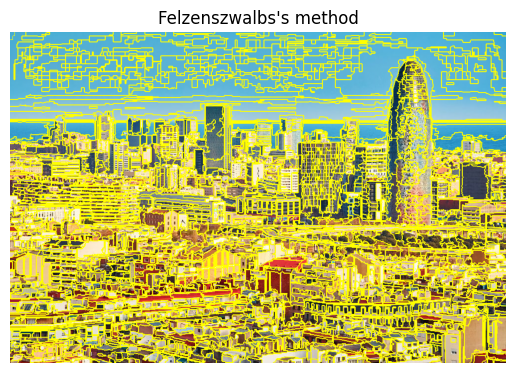

In [2]:
# Import necessary modules
from skimage import io
from skimage.segmentation import felzenszwalb, mark_boundaries
from skimage.util import img_as_float

# Read the image
img = io.imread('images_notebook/barcelona.jpeg')
# Convert the image to float representation for more precision
img = img_as_float(img)

# Apply Felzenszwalb's segmentation method
segments_fz = felzenszwalb(img, scale=100, sigma=0.5, min_size=50)

# Print the shape of the segments and number of unique segments
print("Shape of segments: {}".format(segments_fz.shape))
print(f"Felzenszwalb number of segments: {len(np.unique(segments_fz))}")

# Visualize the result with boundaries marked
plt.imshow(mark_boundaries(img, segments_fz)) 
plt.title("Felzenszwalbs's method")
plt.axis("off")
plt.show()

b) Create a function where you explore at least 3 different parameter combinations in order to obtain a better image segmentation. Your function should receive the image and the set of parameters you would like to change. It should also resize your image to be a third part of the original image size. Your function results should be a visualization of the results and a print of the number of segments.  


Answer the following questions:
- Is it critical to convert the image in grayscale in order to do the image segmentation?
- Is it critical to convert the image in float in order to do the image segmentation?
- Which are the optimal values according to your subjective perception?
- How does each parameter behave?
- Does the image reduction affect the optimal values? 

**Answers to the questions**

1. Is it critical to convert the image in grayscale in order to do the image segmentation?

> No, it's not critical. Felzenszwalb's method works on color images too. However, using grayscale images can sometimes simplify the process and may be preferable depending on the application.

2. Is it critical to convert the image in float in order to do the image segmentation?
  
> It's not critical, but it's recommended. Converting the image to float can ensure more precision during computations, leading to potentially more accurate segmentations.

3. Which are the optimal values according to your subjective perception?

> This is a subjective question and can vary based on the desired granularity of segmentation. From the example parameters provided, the middle set might give a good balance between detail and generalization, but it would depend on the specifics of the image and the desired outcome.

4. How does each parameter behave?
    - > scale: Controls the size of the segments. Higher values result in larger segments.
    - > sigma: This value is used for smoothing the image before segmentation. Higher values will smooth more, potentially leading to larger segments.
    - > min_size: The minimum component size. It ensures that small regions get merged into larger ones.

5. Does the image reduction affect the optimal values?

> Yes, reducing the image size changes its resolution and details, and optimal parameter values for the original image might not be optimal for the reduced image. Lower resolution might require different parameter settings to achieve similar segmentation granularity.

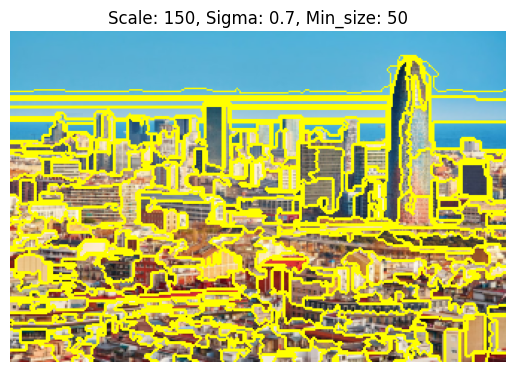

Number of segments: 258


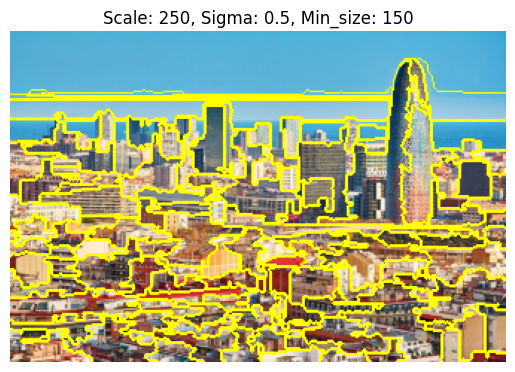

Number of segments: 111


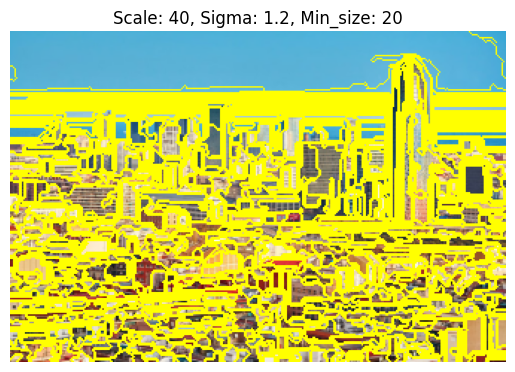

Number of segments: 856


In [3]:
# Your solution here

from skimage.transform import resize

def explore_segmentation(img, params_list):
    # Resize the image to be a third of the original size
    img_resized = resize(img, (img.shape[0] // 3, img.shape[1] // 3))
    
    # Loop over each set of parameters and apply Felzenszwalb's segmentation
    for params in params_list:
        segments = felzenszwalb(img_resized, scale=params['scale'], sigma=params['sigma'], min_size=params['min_size'])
        
        # Visualize the result with boundaries marked
        plt.figure()
        plt.imshow(mark_boundaries(img_resized, segments))
        plt.title(f"Scale: {params['scale']}, Sigma: {params['sigma']}, Min_size: {params['min_size']}")
        plt.axis("off")
        plt.show()
        
        # Print number of segments
        print(f"Number of segments: {len(np.unique(segments))}")

# Example usage
params_list = [
    {'scale': 150, 'sigma': 0.7, 'min_size': 50},
    {'scale': 250, 'sigma': 0.5, 'min_size': 150},
    {'scale': 40, 'sigma': 1.2, 'min_size': 20}
]
explore_segmentation(img, params_list)

c) Comment the definition of the algorithm (use approximately 3 lines at most), its advantages and disadvantages.

**Definition**:
> Felzenszwalb's method is a graph-based segmentation algorithm that partitions an image into regions based on pixel intensity differences.

**Advantages**:
> Efficient on large images, versatile for color/grayscale images, and offers adjustable granularity.

**Disadvantages**:
> Sensitive to parameter settings, potential for over-segmentation, and optimal parameters can vary between images.

### SLIC - K-Means based image segmentation
d) Segment the same image using the SLIC image segmentation algorithm using the parameters by default. 

SLIC number of segments: 29


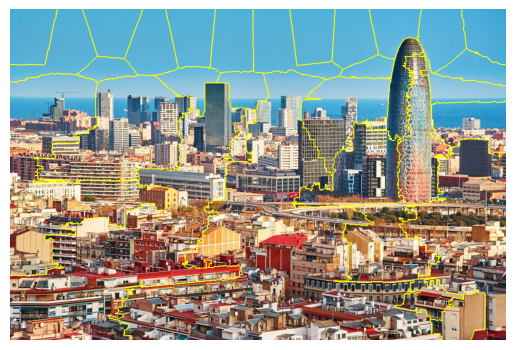

In [4]:
# Your solution here

from skimage.segmentation import slic
from skimage.segmentation import mark_boundaries
import numpy as np

# Apply SLIC segmentation
segments_slic = slic(img, start_label=1)

# Print number of segments
print(f"SLIC number of segments: {len(np.unique(segments_slic))}")

# Display image with segment boundaries
plt.imshow(mark_boundaries(img, segments_slic))
plt.axis("off")
plt.show()

e) Create a function where you explore at least 3 different parameter combinations in order to obtain a better image segmentation. Your function should receive the image and the set of parameters you would like to change. It should also resize your image to be a third part of the original image size. Your function results should be a visualization of the results and a print of the number of segments.  


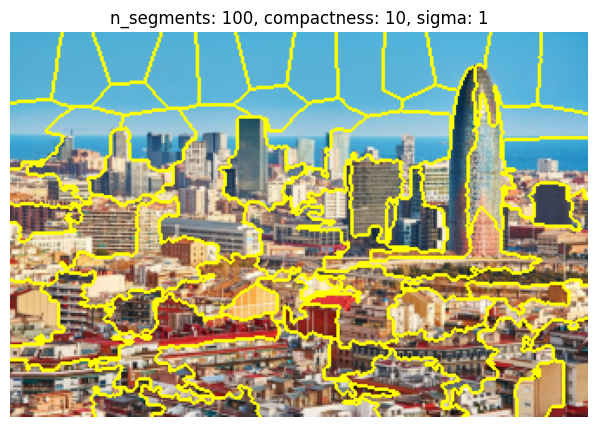

Number of segments: 59



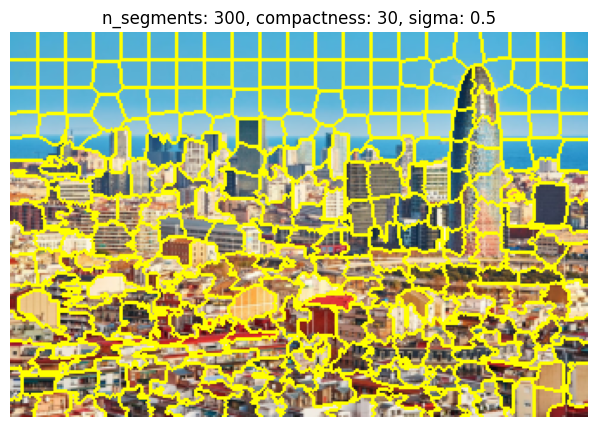

Number of segments: 287



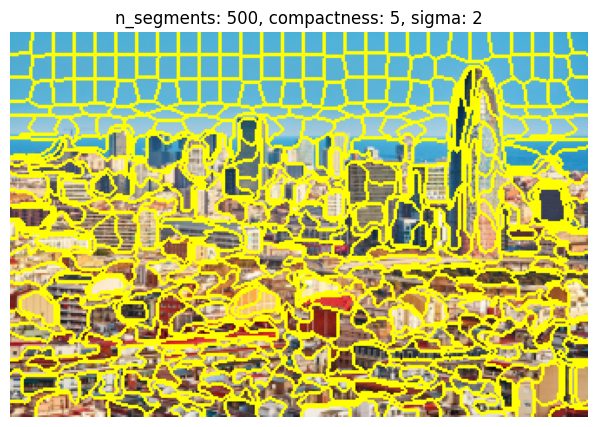

Number of segments: 432



In [8]:
# Your solution here

from skimage.transform import resize
from skimage.segmentation import slic, mark_boundaries
import matplotlib.pyplot as plt
import numpy as np

def explore_slic_parameters(img, params_list):
    # Resize the image to one-third its original size
    img_resized = resize(img, (img.shape[0] // 3, img.shape[1] // 3), anti_aliasing=True)
    
    # Iterate over each parameter set
    for params in params_list:
        segments = slic(img_resized, **params)
        
        # Display segmented image with boundaries
        plt.figure(figsize=(10,5))
        plt.imshow(mark_boundaries(img_resized, segments))
        plt.axis("off")
        plt.title(f"n_segments: {params['n_segments']}, compactness: {params['compactness']}, sigma: {params['sigma']}")
        plt.show()

        print(f"Number of segments: {len(np.unique(segments))}\n")

# Example usage:
params_list = [
    {'n_segments': 100, 'compactness': 10, 'sigma': 1},
    {'n_segments': 300, 'compactness': 30, 'sigma': 0.5},
    {'n_segments': 500, 'compactness': 5, 'sigma': 2}
]

explore_slic_parameters(img, params_list)

f) Comment what the algorithm is (in up to 3 lines).

> SLIC is based on the k-means clustering algorithm, considering both color and spatial domains. It initializes with seed points as cluster centers and iteratively refines clusters using a combined distance metric until convergence to a local minimum.

### Quickshift image segmentation

g) Segment the original image using the Quickshift algorithm. 

Create a loop where you explore kernel_size variations in order to obtain a better image segmentation. Argument why a higher or lower value improves the segmentation results.

> Higher kernel_size values make the algorithm consider a larger neighborhood when clustering pixels. This often results in larger segments and a possible loss in detail, which can be useful for capturing more general structures in the image.

> Lower kernel_size values make the algorithm focus on smaller neighborhoods, producing more and smaller segments. This can capture finer details but may also result in over-segmentation, where even homogeneous regions are divided into multiple segments.

Number of segments: 16106



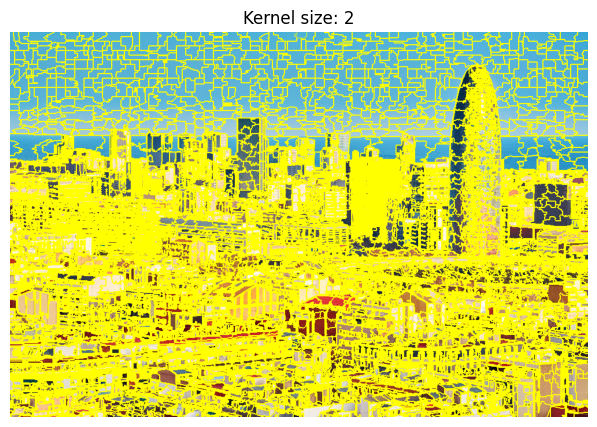

Number of segments: 6883



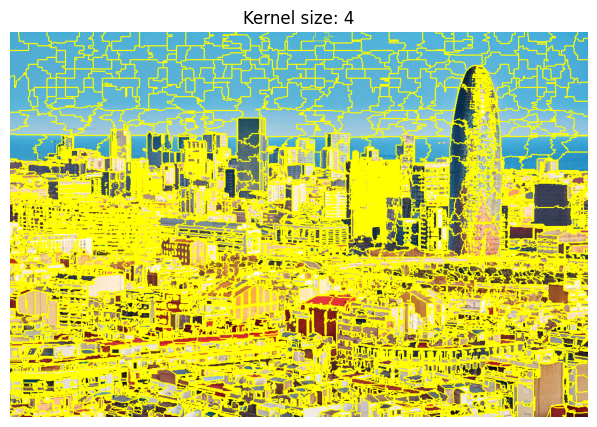

Number of segments: 3679



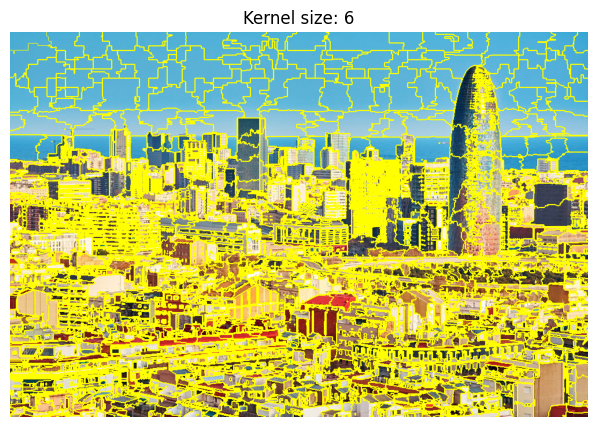

Number of segments: 3090



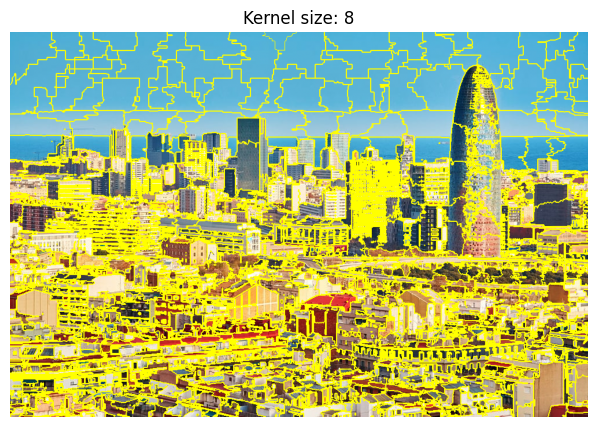

Number of segments: 3172



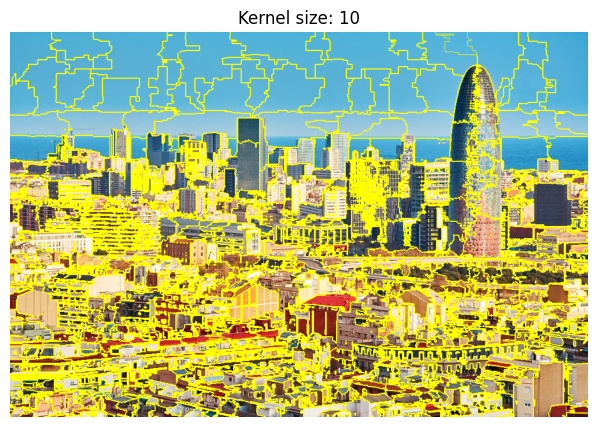

In [7]:
# Your solution here

from skimage.segmentation import quickshift, mark_boundaries

def explore_quickshift_parameters(img, kernel_sizes):
    # Iterate over each kernel size
    for k_size in kernel_sizes:
        segments = quickshift(img, kernel_size=k_size)
        
        # Print number of segments
        print(f"Number of segments: {len(np.unique(segments))}\n")
        
        # Display segmented image with boundaries
        plt.figure(figsize=(10,5))
        plt.imshow(mark_boundaries(img, segments))
        plt.axis("off")
        plt.title(f"Kernel size: {k_size}")
        plt.show()

# Example usage:
kernel_sizes_to_explore = [2, 4, 6, 8, 10]
explore_quickshift_parameters(img, kernel_sizes_to_explore)

h) Comment what the algorithm is (in up to 3 lines).

> Quickshift is a mode-seeking algorithm that segments an image based on color similarity in feature space. It estimates local density peaks which serve as segment centers and assigns pixels to the closest peak. The kernel_size parameter determines the scale of this local density estimation.

### Comparison of segmentation algorithms

Apply the best set of parameters of each algorithm and apply it to: 
1) Original image
1) Salt and pepper noise version of this image
2) Flipped image (horizontally)
3) Canny edge detector result of this image. 

Plot the image and its results of fezenswalb and SLIC algorithm in a 1x3 subplots. 

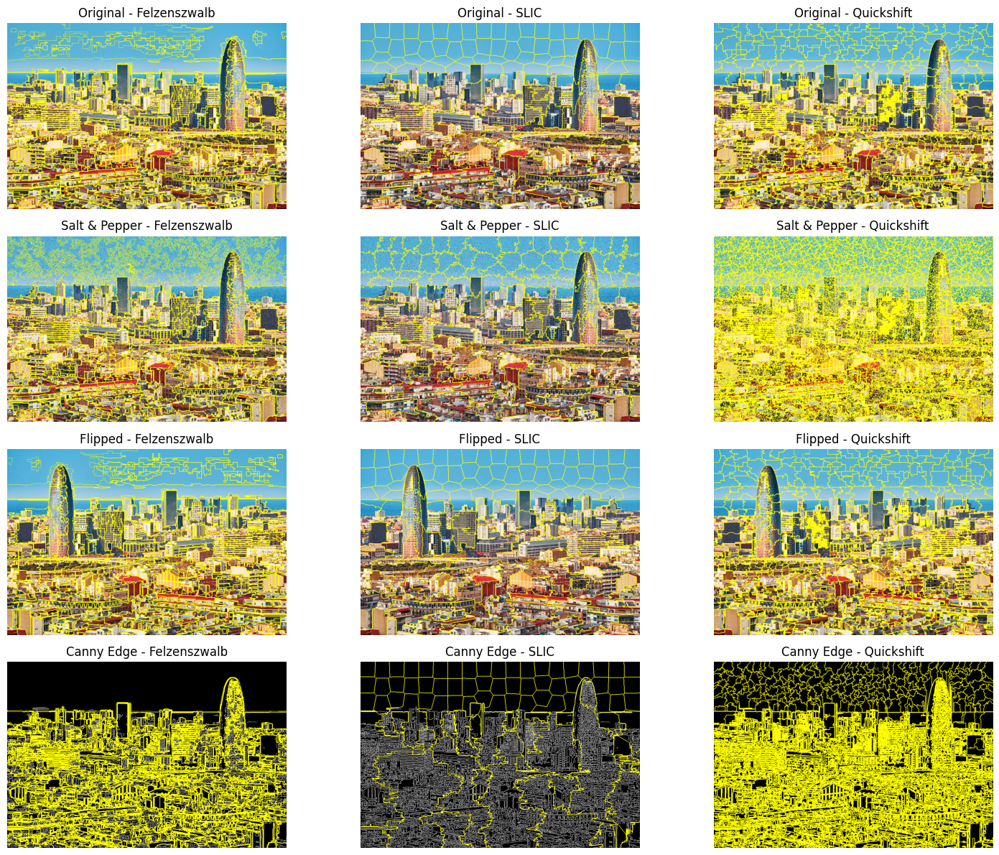

In [9]:
# Your solution here
%matplotlib inline

# Import necessary libraries
from skimage import io
from skimage.util import random_noise
from skimage.feature import canny
from skimage.segmentation import felzenszwalb, slic, quickshift, mark_boundaries
import matplotlib.pyplot as plt
import numpy as np

# Load the original image
img = io.imread('images_notebook/barcelona.jpeg')

# Apply salt and pepper noise to the image
img_sp = random_noise(img, mode='s&p')

# Flip the image horizontally
img_flipped = np.fliplr(img)

# Apply Canny edge detection to the grayscale version of the image
canny_gray = canny(io.imread('images_notebook/barcelona.jpeg', as_gray=True))
# Convert the Canny edge detection result to a 3-channel image for consistency
img_canny = np.stack([canny_gray, canny_gray, canny_gray], axis=-1)

# Define parameters for segmentation algorithms (these are subjectively chosen)
felz_params = {'scale': 250, 'sigma': 0.5, 'min_size': 150}
slic_params = {'n_segments': 250, 'compactness': 10, 'sigma': 1}
quickshift_params = {'kernel_size': 4, 'max_dist': 20, 'ratio': 0.5}

# Function to apply segmentation algorithms to an image
def apply_segmentation(image):
    # Apply Felzenszwalb segmentation
    felz_result = felzenszwalb(image, **felz_params)
    # Apply SLIC segmentation
    slic_result = slic(image, **slic_params)
    # Apply Quickshift segmentation
    quickshift_result = quickshift(image, **quickshift_params)
    return felz_result, slic_result, quickshift_result

# Apply segmentation algorithms to different image variations
original_results = apply_segmentation(img)
sp_results = apply_segmentation(img_sp)
flipped_results = apply_segmentation(img_flipped)
canny_results = apply_segmentation(img_canny)

# Prepare images and results for display
images_to_display = [img, img_sp, img_flipped, img_canny]
results = [original_results, sp_results, flipped_results, canny_results]
titles = ["Original", "Salt & Pepper", "Flipped", "Canny Edge"]
algorithms = ["Felzenszwalb", "SLIC", "Quickshift"]

# Display the images with segmentation boundaries
plt.figure(figsize=(20, 12))
for idx, (image, (felz, slic_img, quick)) in enumerate(zip(images_to_display, results)):
    for alg_index, alg_title in enumerate(algorithms):
        plt.subplot(4, 4, idx*4 + alg_index + 1)
        if alg_index == 0:
            plt.imshow(mark_boundaries(image, felz))
        elif alg_index == 1:
            plt.imshow(mark_boundaries(image, slic_img))
        else:
            plt.imshow(mark_boundaries(image, quick))
        plt.axis('off')
        plt.title(titles[idx] + " - " + alg_title)

plt.tight_layout()
plt.show()

- **Do the transformations affect the segmentation? Why or why not?**
> Yes, transformations can affect the segmentation:

> Salt and Pepper Noise: Introducing noise can potentially lead to over-segmentation as the algorithm might perceive the noise as distinct features. The clustering-based approaches like SLIC and Quickshift, which rely on color similarity, can be particularly affected by such noise.

> Flipping the Image (horizontally): A horizontal flip doesn't change the image's content or its colors, but merely rearranges them. Algorithms like SLIC, Felzenszwalb, and Quickshift rely on spatial and color properties. While the colors remain the same, the spatial distribution changes, and segments might be perceived differently around the boundaries, especially if the original image wasn't symmetrical.

> Canny Edge Detector Result: The Canny edge detector outputs a binary image emphasizing edges. Segmentation algorithms applied to this will produce different results, as they now work primarily with structural boundaries rather than color or intensity variations. The number of segments might significantly reduce, and the segments might align more with the prominent edges.
    
- **Can the number of segments can be used as a criterion for the performance of the algorithms?**
> The number of segments can give some insight but isn't a comprehensive criterion for performance:

> Depends on Objective: If our goal is to obtain a specific number of superpixels or segments, then yes, the number of segments can be a criterion. However, in most cases, the quality of the segmentation (i.e., how well the segments represent meaningful areas of the image) is more important.

> Over-segmentation vs. Under-segmentation: A high number of segments could mean the algorithm is over-segmenting, detecting minute details or noise. Conversely, a low number could mean it's missing details. Neither is inherently better; it depends on the application.

> Qualitative Evaluation: It's often beneficial to visually inspect the segmented results. Some segments might be more semantically meaningful or adhere better to actual object boundaries, even if the number of segments is higher or lower than another method.

> Other Metrics: There are other metrics like boundary adherence, compactness, or silhouette score that might provide a more comprehensive view of the segmentation quality.

## 3.2 Segmentation via clustering

In this exercise, you will implement hierarchical clustering to segment the "images_notebook/loro.png" image in gray scales. First load and visualize the image, then implement hierarchical clustering over the pixels and plot the final results side by side to the original image

Hint: Sklearn has a hierarchical clustering implementation you should use. Reshape your dataset such that you have a 2 dimensional array. Use linkage "ward" and grid_to_graph function for the connectivity parameter. 

<img src="images_notebook/loro_segmentation.jpg" width=600>

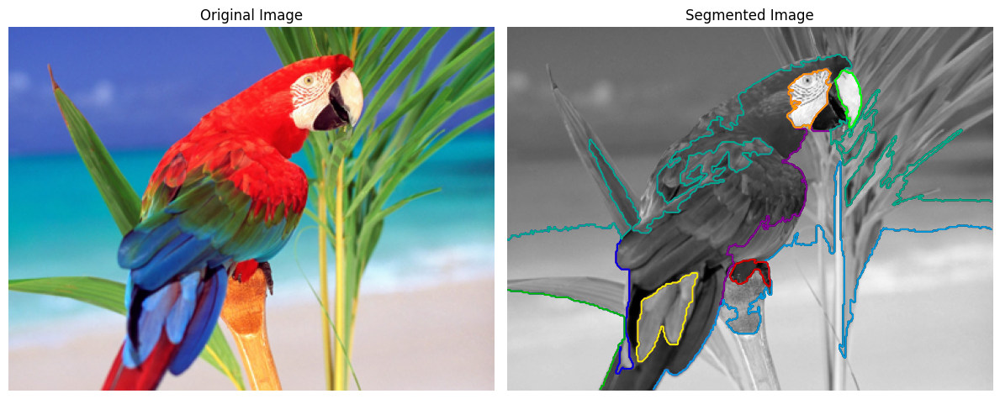

In [10]:
# Your solution here

from skimage import io, color
import matplotlib.pyplot as plt
from sklearn.cluster import AgglomerativeClustering
from sklearn.feature_extraction.image import grid_to_graph

# Load and visualize the image
image_path = 'images_notebook/loro.png'
image = io.imread(image_path)
gray_image = color.rgb2gray(image)

# Display the original image
plt.figure(figsize=(12, 6))
plt.subplot(121)
plt.imshow(image)
plt.title('Original Image')
plt.axis('off')

# Reshape the image for clustering
X = gray_image.reshape(-1, 1)

# Create a grid to graph connectivity
shape = gray_image.shape
connectivity = grid_to_graph(*shape)

# Apply hierarchical clustering
n_clusters = 10
ward = AgglomerativeClustering(n_clusters=n_clusters, linkage='ward', connectivity=connectivity)
ward.fit(X)

# Reshape back to image dimensions
labels = ward.labels_.reshape(shape)

# Plot the segmentation
plt.subplot(122)
plt.imshow(gray_image, cmap='gray')
for l in range(n_clusters):
    plt.contour(labels == l,colors=[plt.cm.nipy_spectral(l / float(n_clusters)), ])
plt.title('Segmented Image')
plt.axis('off')

plt.tight_layout()
plt.show()

## Video segmentation

Given the video stored in ‘Barcelona-sequence’, which contains images acquired by a static camera, we ask you to:
- Find the temporal segments of the video (shots). Where the scene change? (Section 3.1)
- Extract the background images and thus, remove all the "artifacts" considered as foreground related to movement. (Section 3.2)




<img src="images_notebook/screenshot.png" width=600>

## 3.3 Segmentation of video shots

Read and visualize the sequence of images "images_notebook/Barcelona-sequence".

**Hint:** In order to read a collection of images, we wil use the function [animation.FuncAnimation](https://matplotlib.org/2.0.0/api/_as_gen/matplotlib.animation.FuncAnimation.html). Observe in the following Example, how FuncAnimation is used to read and visualize a sequence of frames. Explore the parameters of animation.FuncAnimation().

**Parameters of animation.FuncAnimation()**

> fig - This is the figure object on which the animation will be drawn. It sets the plot or figure that the animation is built upon.

> run - This is the animation function that will be called at each frame of the animation. This function updates the figure.

> interval - Set to 1, this parameter specifies the delay between frames in milliseconds. In this case, it means each frame is updated every millisecond.

> blit - When set to True, blitting is used to optimize drawing. Only the parts of the plot which have changed are redrawn at each frame. This can enhance performance but is not supported on all backends.

> frames - This parameter determines the number of frames of the animation. len(ic) suggests that the number of frames is equal to the length of the ic list or array.

> repeat - Set to False, this indicates that the animation will not repeat once all frames have been displayed.

In [3]:
import numpy as np
import skimage
from skimage import io
import matplotlib.pyplot as plt
import matplotlib.animation as animation

## IMPORTANT TO RUN THIS CELL IF VIDEO IS NOT SHOWING CORRECTLY

In [2]:
#!pip install --upgrade matplotlib

In [5]:
# Changing the pluggin is necessary always when visualizing a video!
%matplotlib nbagg

<IPython.core.display.Javascript object>


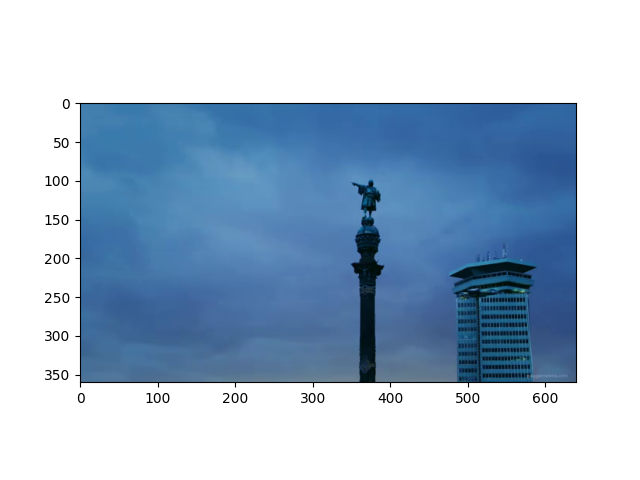

In [6]:
# Your solution here
# Reading a sequence of images from a folder
ic = io.ImageCollection('images_notebook/Barcelona-sequence/*.png')

fig = plt.figure()  # Create figure
im = plt.imshow(ic[0], animated=True) # Visualize the first image

def run(i):   # Updating the frame visualization
    im.set_array(ic[i]) # Changing the content of the canvas
    return im, # Return a tuple!

plt.show()
ani = animation.FuncAnimation(fig, run, interval=50, blit=True, frames=len(ic), repeat= False)
plt.show()

a) Find where a shot (scene) finishes and the following starts (the shot boundaries). To achieve this goal, we are going to compute the difference between the histograms of consecutive frames. The proposed solution required:

- Compute the histogram for each RGB channel

- The 'total' histogram of the image is computed as the sum of the three histograms

- Compute the mean of the difference (in absolute value) between the histograms of two consecutive frames

Those differences with largest values corresponds to the transitions between shots. 

Therefore, **we need to create a funtion which return an array with the differences between histograms. We will plot the resulting array in order to localice the maximum values as well as a suitable threshold to define localize the transitions.**

<img src="images_notebook/histogramshot.png" width=600>
<img src="images_notebook/difference_histograms.png">

To solve this exercise, you need to create a **temporal plot** showing a frame by frame difference measure to be defined by you, being applicable to distinguish the shots. Define a criterion to detect the boundaries of the shots and visualize it in a static plot.

The plot above was obtain by using 64 bins histogram and the measure as mean of absolute difference. 

In [3]:
# Import all modules from the skimage library
from skimage import *

def histogram_n_bins(image, bins):
    """
    Compute the combined histogram for all RGB channels.
    """
    # Convert the image to float format for more precise calculations
    image_float = img_as_float(image)
    # Compute histograms for each color channel and sum them
    histograms = [exposure.histogram(image_float[:,:,i], nbins=bins)[0] for i in range(3)]
    return np.array(sum(histograms))

In [4]:
def calculate_mean(bins=64):
    """
    Calculate the mean of the histogram differences for each frame in the collection.
    """
    # Raise an error if the image collection is empty
    if not ic:
        raise ValueError("Image collection is empty")
    
    # Convert the image collection to a list
    temp = list(ic)
    # Compute the histogram for the first frame
    prev_hist = histogram_n_bins(temp[0], bins)

    plot_data = []

    # Iterate over each frame starting from the second one
    for frame in temp[1:]:
        # Compute the histogram for the current frame
        current_hist = histogram_n_bins(frame, bins)
        # Calculate the mean absolute difference between the current and previous histograms
        hist_diff = np.mean(np.abs(prev_hist - current_hist))
        # Append the histogram difference to the list
        plot_data.append(hist_diff)
        # Update the previous histogram for the next iteration
        prev_hist = current_hist

    return plot_data

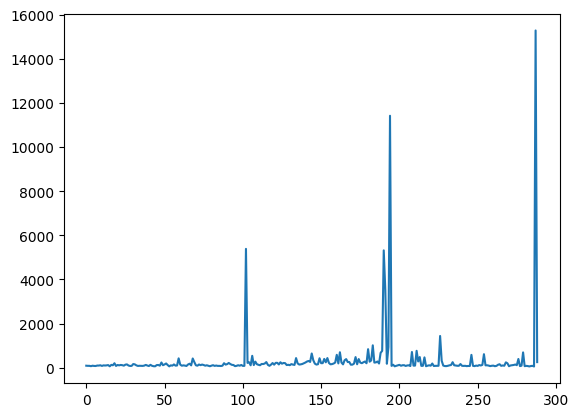

In [3]:
import numpy as np
import skimage
from skimage import io
import matplotlib.pyplot as plt
import matplotlib.animation as animation

ic = io.ImageCollection('images_notebook/Barcelona-sequence/*.png')

# Enable inline plotting for Jupyter notebooks
%matplotlib inline
# Calculate the mean histogram differences
value_list = calculate_mean()
# Plot the values
plt.plot(value_list, "")
plt.show()

b) Additionally, create an interactive plot executing the following code in "Example A". Substitute the bottom plot with the temporal plot showing the differences between the consecutive frames. 

In [5]:
# Example A
def data_generator():
    """
    A generator function that yields time and value pairs from a calculated mean list.

    This function iterates through the calculated mean values, yielding a tuple of 
    the time step (starting from 1) and the mean value at each step.
    """
    # Calculate mean values (presumably histogram differences) using a predefined function
    y_data = calculate_mean()

    # Enumerate over the calculated mean values, starting the count at 1
    for t, y in enumerate(y_data, start=1):
        # Yield a tuple of time step and value at each iteration
        yield t, y

<IPython.core.display.Javascript object>


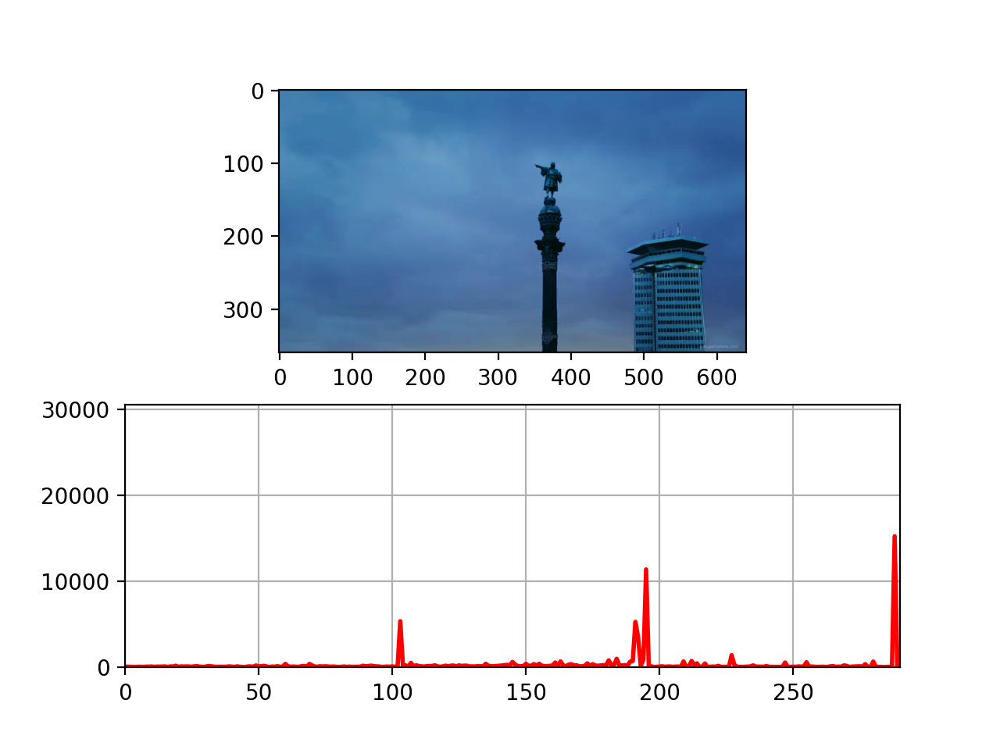

In [6]:
import numpy as np
import skimage
from skimage import io
import matplotlib.pyplot as plt
import matplotlib.animation as animation

ic = io.ImageCollection('images_notebook/Barcelona-sequence/*.png')

# Changing the pluggin is necessary always when visualizing a video!
%matplotlib nbagg

# Create a figure with two subplots
fig, (ax1, ax2) = plt.subplots(2, 1)

# Initialize a line object on the second axes for plotting
line, = ax2.plot([], [], lw=2, color='r')

# Set initial limits and grid for the histogram difference plot
ax2.set_ylim(0, max(calculate_mean()))
ax2.set_xlim(0, len(ic))  # Adjust to match the number of frames
ax2.grid()

# Initialize data arrays
xdata, ydata = [], []

def run(data):
    # Update the data plot
    t, y = data
    xdata.append(t)
    ydata.append(y)

    # Plot the current frame on the top subplot
    ax1.imshow(ic[t - 1])

    # Update the histogram difference plot
    xmin, xmax = ax2.get_xlim()
    ymin, ymax = ax2.get_ylim()
    if t >= xmax:
        ax2.set_xlim(xmin, 2 * xmax)
        ax2.figure.canvas.draw()
    if y >= ymax:
        ax2.set_ylim(ymin, 2 * ymax)
        ax2.figure.canvas.draw()

    # Update the data of the line object
    line.set_data(xdata, ydata)

    return line,

# Create the animation
ani = animation.FuncAnimation(fig, run, data_generator, blit=True, interval=100, repeat=False, cache_frame_data=False)

plt.show()

c) Show the initial and final images of each shot extracted as follows:

<img src="images_notebook/result_shot_detection.png">


Use the previous plot to define the proper threshold value over the differences of histograms. Use the threshold to localize indexes of the array returned by the function proposed in the previous question and, therefore, localize the initial and final frames for each shot as shown in the reference image


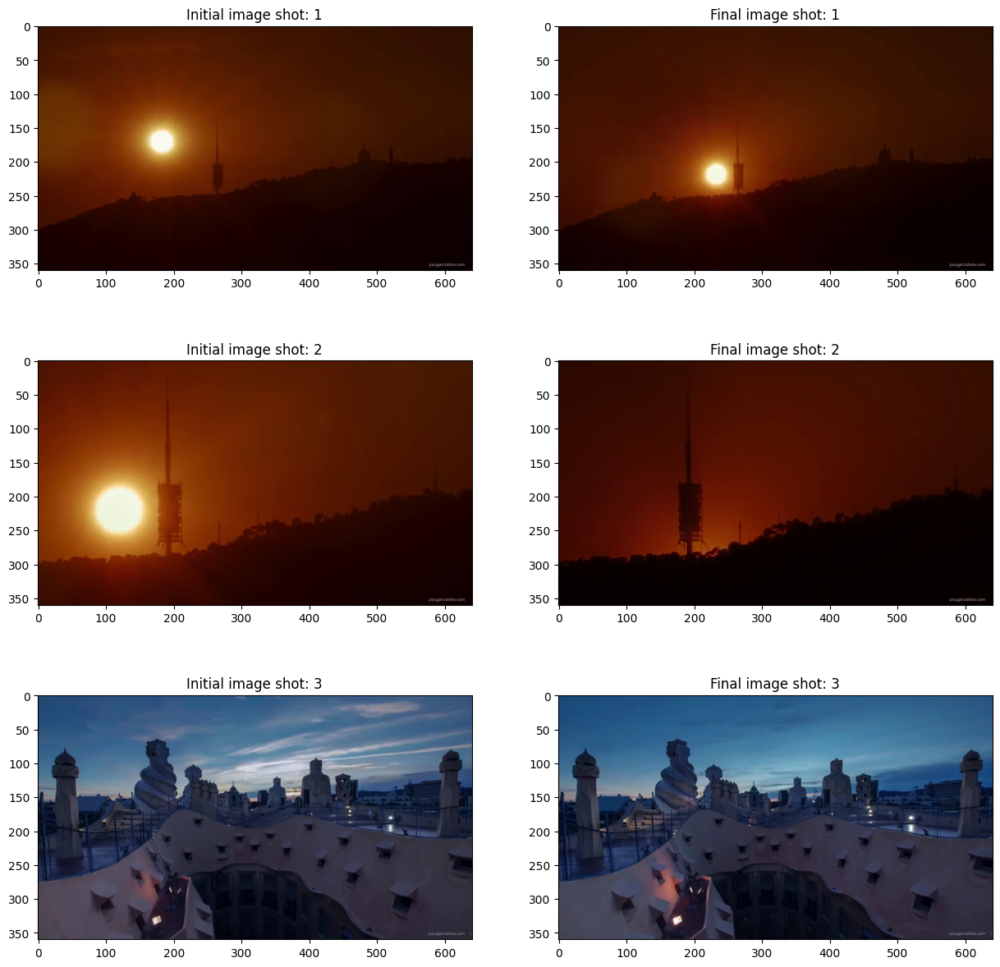

In [7]:
# Your solution here

import numpy as np
import skimage
from skimage import io
import matplotlib.pyplot as plt
%matplotlib inline

def find_scenes(n, fig_size):
    y_data = calculate_mean()

    # Selects the indices of the 'n' highest values in 'y_data' to identify key scenes.
    final = np.argsort(y_data)[-n:]

    # Calculates the start index of each scene based on the end indices.
    initial = []
    last = -1
    for i in final:
        initial.append(last+1)
        last = i

    # Combines start and end indices of scenes and sorts them in ascending order.
    images = [*initial, *final]
    images.sort()

    # Creates titles for the initial and final shots of each scene.
    init_titles = ["Initial image shot: " + str(i+1) for i in range(n)]
    final_titles = ["Final image shot: " + str(i+1) for i in range(n)]

    # Merges the titles in an interleaved fashion for display.
    titles = [None] * (len(init_titles) + len(final_titles))
    titles[::2] = init_titles
    titles[1::2] = final_titles

    # Sets up a subplot for visualization of the scenes.
    figuras, fig_channels = plt.subplots(ncols=2, nrows=n, figsize=fig_size)
    idx = 0

    # Iterates over each scene and displays the initial and final shots with titles.
    for i in range(n):
        for j in range(2):
            # Displays each selected image.
            fig_channels[i][j].imshow(ic[images[idx]])
            fig_channels[i][j].set_title(titles[idx])
            idx += 1

    # Shows the plotted figures.
    plt.show()

ic = io.ImageCollection('images_notebook/Barcelona-sequence/*.png')
images = find_scenes(3, (15,15))

d) Which measure have you used in order to visually distinguish the shots in a plot? Explain your solution.

> The measure used for visually distinguishing shots is the mean of the absolute differences in the combined RGB histograms between consecutive frames. This method is based on the idea that significant changes in the content of consecutive frames will reflect as large differences in their histograms. By calculating the mean of these differences, the code effectively identifies frames where substantial visual changes occur, which could indicate scene transitions.

> So basically, throught the list that contains the mean of the differences between two consecutives histograms (the mean value of RGB), we can say that those peaks correspond to transitions between two shots.
Our solution uses that list which contains the final shot to get the initial shot and then plot both of them.

e) Would your video segmentation strategy be able to separate and track objects? Argue your answer.

> The current strategy would not be effective for separating and tracking individual objects. This approach is designed to detect significant changes in the overall visual content of frames, not to track specific objects. It relies on global histogram changes, which can indicate scene transitions but do not provide information about the location, movement, or identity of objects within the frames.

f) Would your video segmentation strategy be able to capture continuous transition? Argue your answer.

> This strategy would have limited effectiveness in capturing continuous, gradual transitions. The method is more suited to detecting abrupt visual changes between frames, as gradual transitions might not produce sufficiently large histogram differences to be identified as key scenes. Therefore, it may miss or inaccurately represent scenes where changes occur smoothly over a longer sequence of frames.

## 3.4 Background subtraction

Apply the background subtraction algorithm (check theory material).

<img src="images_notebook/screenshot2.png" width=500>

a) Visualize the following images for each different scene of the video:

    1) an image belonging to the shot
    2) the background image, and
    3) the foreground.
    
**Hint**: You can construct a mask obtained from the original image and the background in order to know which parts of the image form part from the foreground and recover from the original image just the foreground regions.

In [8]:
# Your solution here

from skimage.segmentation import mark_boundaries

# Function to display images with marked boundaries.
def showImage(figsize, original, images, titles):
    """
    Display images with marked boundaries.
    Args:
        figsize: Size of the figure.
        original: Original image.
        images: List of images to display.
        titles: Titles for each image.
    """
    # Create a figure with specified size
    fig = plt.figure(figsize=figsize)

    # Loop through each image and its corresponding title
    for i, image in enumerate(images):
        # Add a subplot for each image
        fig.add_subplot(1, len(images), i + 1)
        # Set the title for each image
        plt.title(titles[i])
        # Display the image with marked boundaries over the original
        plt.imshow(mark_boundaries(original, image))
        # Remove axis ticks
        plt.axis('off')

    # Show the figure with all images
    plt.show()

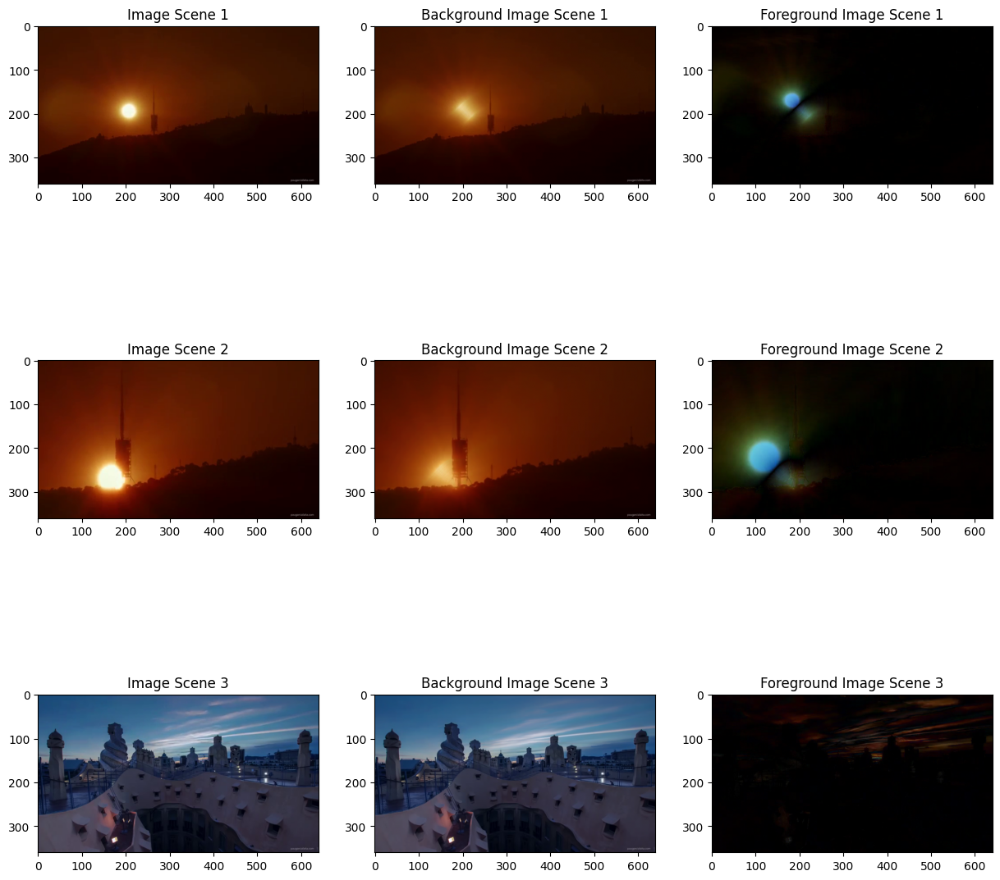

In [9]:
# Your solution here

# Enable inline plotting for Jupyter notebooks
%matplotlib inline

# Function to generate background and foreground images.
def generate_bg_fg(initial, final):
    """
    Generate background and foreground images for a given frame range.
    Args:
        initial: Initial frame index.
        final: Final frame index.
    Returns:
        Tuple of (image, background, foreground).
    """
    # Determine the size of the image collection
    size = ic[0].shape

    # Initialize an array for the background image
    background = np.zeros(size)
    # Convert the images in the given range to float and store them in a list
    images = [img_as_float(ic[i]) for i in range(initial, final + 1)]

    # Calculate the index of the middle image in the range
    middle_image_index = int((initial + final) / 2)
    # Select the middle image
    image = ic[middle_image_index]
    # Calculate the background as the median of the images
    background = np.median(images, axis=0)
    # Calculate the foreground by subtracting the background from the first image
    foreground = np.abs(images[0] - background)
    
    return (image, background, foreground)

# Function to find and display scenes with their backgrounds and foregrounds.
def find_scenes(n, fig_size, return_scenes=False):
    """
    Find and display scenes with their backgrounds and foregrounds.
    Args:
        n: Number of scenes to find.
        fig_size: Size of the figure for displaying the scenes.
    """
    # Calculate mean values (histogram differences) for each frame in the collection
    y_data = calculate_mean()
    # Find the frames with the highest differences
    final_frames = np.argsort(y_data)[-n:]

    # Initialize the list for initial frames
    initial_frames = []
    last = -1
    # Determine the initial frame for each scene
    for frame in final_frames:
        initial_frames.append(last + 1)
        last = frame
    
    # Combine initial and final frames and sort them
    images = [*initial_frames, *final_frames]
    images.sort()
    # Create pairs of initial and final frames for each scene
    scenes = list(zip(*[images[i::2] for i in range(2)]))

    # Return the scenes if requested
    if return_scenes:
        return scenes

    # Initialize list to store images for each scene
    images_scene = []
    # Generate background and foreground images for each scene
    for scene in scenes:
        bg = generate_bg_fg(*scene)  # Unpack scene tuple into initial and final frame indices
        images_scene.extend(bg)
    
    # Prepare titles for each type of image
    original_titles = ["Image Scene " + str(i + 1) for i in range(n)] 
    background_titles = ["Background Image Scene " + str(i + 1) for i in range(n)]
    foreground_titles = ["Foreground Image Scene " + str(i + 1) for i in range(n)]

    # Merge all titles into a single list
    titles = [None] * (len(original_titles) + len(background_titles) + len(foreground_titles))
    titles[::3] = original_titles
    titles[1::3] = background_titles
    titles[2::3] = foreground_titles

    # Create subplots for displaying images
    _, positions = plt.subplots(ncols=3, nrows=n, figsize=fig_size)
    idx = 0
    # Loop through each row (scene) and column (image type) to display images
    for i in range(n):
        for j in range(3):
            # Display each image in the subplot grid
            positions[i][j].imshow(images_scene[idx])
            # Set title for each image
            positions[i][j].set_title(titles[idx])
            idx += 1
    # Show the final plot with all images
    plt.show()

find_scenes(3, (15, 15))

b) What do the static background images represent?

> The static background images represent a consistent, unchanging scene or setting in the video. They are typically obtained by taking a median or mean of pixel values over several frames. This process helps in identifying and removing static elements in the scene, allowing the algorithm to focus on moving or dynamic objects, which constitute the foreground.

c) What happens if the shots are not correctly extracted? And, what happens if you find too many shots in the video?

> Incorrect Shot Extraction: If shots are not correctly extracted, the background and foreground calculations might become inaccurate. This could lead to either missing important dynamic elements (if the shot is too broad and includes multiple scene changes) or capturing too little of the scene changes (if the shot is too narrow).

> Too Many Shots: Finding too many shots can lead to over-segmentation of the video. This might result in a situation where minor or insignificant changes in the scene are treated as separate shots, leading to a fragmented and possibly inaccurate representation of the actual content and dynamics of the video.

d) What happens if you subtract the background image from the original one?

> Subtracting the background image from the original one isolates the foreground elements. This subtraction emphasizes the differences between the static background and the moving or changing elements in the scene. The result is an image or a set of images highlighting the dynamic objects or changes in the scene, which is useful in various computer vision tasks like object detection, tracking, and activity recognition.

e) In which situations does the algorithm work and in which it does not? Do you see any additional application for this algorithm?

> Effective Situations: The algorithm works well in controlled environments with a distinct and unchanging background and clearly identifiable moving objects. This is common in surveillance, traffic monitoring, and controlled laboratory settings.

> Ineffective Situations: The algorithm struggles in scenarios with complex backgrounds, significant lighting changes, or when the background itself contains moving elements (like trees moving in the wind). It also faces challenges in crowded scenes where distinguishing between foreground and background becomes complex.

**Additional applications**
> Surveillance and Security: Detecting unauthorized movement or activities in restricted areas.

> Traffic Monitoring: Identifying vehicles and pedestrians in urban traffic scenes.

> Event Detection in Sports: Automatically detecting important events in sports broadcasts.

> Video Editing: For special effects, such as green screen techniques where a specific background needs to be separated from the foreground.

> Medical Imaging: In enhancing certain features in medical images, such as isolating a moving organ from static tissues.

f) Visualize the highest and lowest similarity frame with respect to the foreground images of each scene. You can use the metric of your like, explain why you picked it.

> One common and effective metric for comparing images is the Structural Similarity Index (SSIM). SSIM is chosen because it considers changes in texture, luminance, and contrast, providing a more comprehensive measure of similarity compared to simple pixel-wise differences.

**Steps to Implement the Visualization:**

1. Calculate Foreground Images for Each Scene:
    > Use the background subtraction method from the previous code to obtain the foreground images for each scene.

2. Measure Similarity Using SSIM:
    > For each scene, compute the SSIM between the foreground image and all other frames within that scene. SSIM values range from -1 to 1, where a value of 1 indicates perfect similarity.

3. Identify Highest and Lowest Similarity Frames:
    > For each scene, identify the frame with the highest SSIM value (most similar) and the frame with the lowest SSIM value (least similar) with respect to the foreground image.

4. Visualize the Frames:
    > Display these frames alongside their corresponding foreground images for a visual comparison.

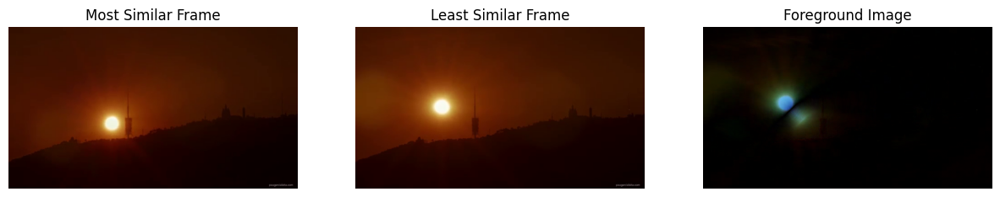

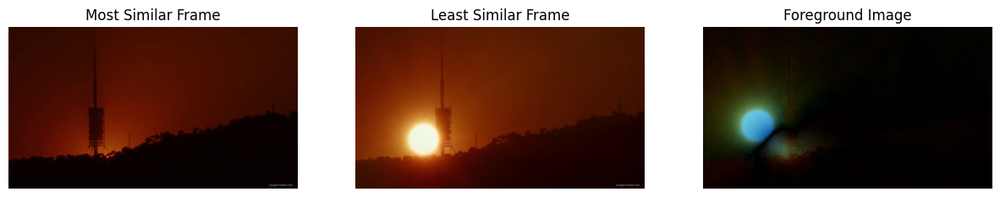

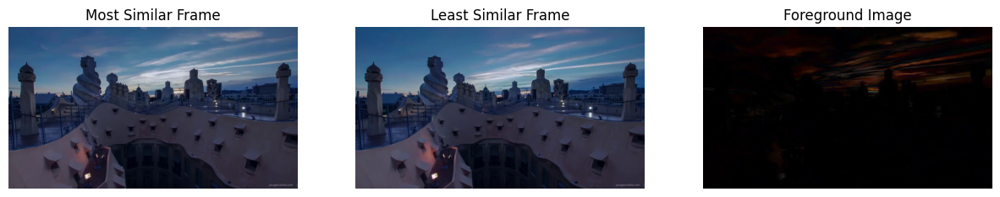

In [10]:
# Your solution here

from skimage.metrics import structural_similarity as ssim

def find_similarity_frames(scene):
    """
    Find the frames with the highest and lowest similarity to the foreground image in a given scene.
    Args:
        scene: A tuple containing the initial and final frame indices of the scene.
    Returns:
        Tuple of (most similar frame, least similar frame, foreground image).
    """
    # Generate the background and foreground images for the scene
    foreground = generate_bg_fg(*scene)[2]
    similarities = []

    # Iterate over each frame in the scene
    for frame in ic[scene[0]:scene[1] + 1]:
        # Convert the frame to float format for SSIM calculation
        float_frame = img_as_float(frame)
        # Compute the SSIM between the foreground and the current frame
        frame_similarity = ssim(foreground, float_frame, data_range=float_frame.max() - float_frame.min(), channel_axis=-1)
        # Append the similarity score to the list
        similarities.append(frame_similarity)

    # Find indices of the most and least similar frames
    most_similar_idx = np.argmax(similarities) + scene[0]
    least_similar_idx = np.argmin(similarities) + scene[0]

    # Return the most and least similar frames along with the foreground image
    return (ic[most_similar_idx], ic[least_similar_idx], foreground)

def visualize_similarity_frames(n, fig_size):
    """
    Visualize the most and least similar frames for the top N scenes.
    Args:
        n: Number of scenes to analyze.
        fig_size: Size of the figure for displaying the frames.
    """
    # Find the scenes with significant changes
    scenes = find_scenes(n, fig_size, return_scenes=True)
    # Iterate over each scene
    for scene in scenes:
        # Find the most and least similar frames for each scene
        most_similar, least_similar, foreground = find_similarity_frames(scene)
        
        # Set up plotting environment
        plt.figure(figsize=fig_size)
        # Plot the most similar frame
        plt.subplot(1, 3, 1)
        plt.imshow(most_similar)
        plt.title("Most Similar Frame")
        plt.axis('off')

        # Plot the least similar frame
        plt.subplot(1, 3, 2)
        plt.imshow(least_similar)
        plt.title("Least Similar Frame")
        plt.axis('off')

        # Plot the foreground image
        plt.subplot(1, 3, 3)
        plt.imshow(foreground)
        plt.title("Foreground Image")
        plt.axis('off')

        # Display the plot
        plt.show()

# Example usage
visualize_similarity_frames(3, (15, 5))